# Custom Training with YOLOv5

In this tutorial, we assemble a dataset and train a custom YOLOv5 model to recognize the objects in our dataset. To do so we will take the following steps:

* Gather a dataset of images and label our dataset
* Export our dataset to YOLOv5
* Train YOLOv5 to recognize the objects in our dataset
* Evaluate our YOLOv5 model's performance
* Run test inference to view our model at work



![](https://uploads-ssl.webflow.com/5f6bc60e665f54545a1e52a5/615627e5824c9c6195abfda9_computer-vision-cycle.png)

# Step 1: Install Requirements

In [1]:
# conda create --name yolov5 --y
# conda activate yolov5
# conda install -c anaconda ipykernel --y
# python -m ipykernel install --user --name=yolov5

In [2]:
pwd

'/home/studio-lab-user/teledermatologyAI_capstone/objDetection'

In [3]:
cd /home/studio-lab-user/teledermatologyAI_capstone/objDetection

/home/studio-lab-user/teledermatologyAI_capstone/objDetection


In [4]:
rm -rf yolov5

In [5]:
#clone YOLOv5
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
# %pip install -qr requirements.txt # install dependencies
# %pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14379, done.
remote: Total 14379 (delta 0), reused 0 (delta 0), pack-reused 14379
Receiving objects: 100% (14379/14379), 13.32 MiB | 41.85 MiB/s, done.
Resolving deltas: 100% (9955/9955), done.
/home/studio-lab-user/teledermatologyAI_capstone/objDetection/yolov5


/home/studio-lab-user/.conda/envs/yolov5/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Setup complete. Using torch 1.11.0+cu102 (Tesla T4)


In [6]:
# !git reset --hard cd35a009ba964331abccd30f6fa0614224105d39
# %pip uninstall torch --y
# %pip install torch==1.11.0
# %pip uninstall torchvision --y
# %pip install torchvision==0.12.0

# Step 2: Assemble Our Dataset

In order to train our custom model, we need to assemble a dataset of representative images with bounding box annotations around the objects that we want to detect. And we need our dataset to be in YOLOv5 format.

In Roboflow, you can choose between two paths:

* Convert an existing dataset to YOLOv5 format. Roboflow supports over [30 formats object detection formats](https://roboflow.com/formats) for conversion.
* Upload raw images and annotate them in Roboflow with [Roboflow Annotate](https://docs.roboflow.com/annotate).

# Annotate

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/roboflow-annotate.gif)

# Version

![](https://roboflow-darknet.s3.us-east-2.amazonaws.com/robolfow-preprocessing.png)


In [7]:
# from roboflow import Roboflow
# rf = Roboflow(model_format="yolov5", notebook="ultralytics")

In [8]:
# set up environment
home_location = '/home/studio-lab-user/teledermatologyAI_capstone/objDetection'
os.environ["DATASET_DIRECTORY"] = f"{home_location}/datasets"

In [9]:
# #after following the link above, recieve python code with these fields filled in
# %pip install opencv-contrib-python-headless
# from roboflow import Roboflow
# rf = Roboflow(api_key="tRmZ4hK1gi419cwsMWE2")
# project = rf.workspace("rubyhan-berkeley-edu").project("w210_teledermatologyai")
# dataset = project.version(15).download("yolov5")

# Step 3: Train Our Custom YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training

In [10]:
rm -rf runs/train/exp

In [11]:
dataset_location = f'{home_location}/datasets/w210_teledermatologyAI-15'

In [12]:
!cat $dataset_location/data.yaml

names:
- Benign Marking or Mole
- Non-Cancerous Skin Condition
- Potentially Malignant Skin Tumors
- Toxin
- Unclassified
nc: 5
train: /home/studio-lab-user/teledermatologyAI_capstone/objDetection/datasets/w210_teledermatologyAI-15/train/images
val: /home/studio-lab-user/teledermatologyAI_capstone/objDetection/datasets/w210_teledermatologyAI-15/valid/images


In [13]:
!python train.py --img 416 --batch 64 --epochs 10 --data $dataset_location/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/home/studio-lab-user/teledermatologyAI_capstone/objDetection/datasets/w210_teledermatologyAI-15/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-205-geef9057 Python-3.10.4 torch-1.11.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, o

# Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

If you are new to these metrics, the one you want to focus on is `mAP_0.5` - learn more about mean average precision [here](https://blog.roboflow.com/mean-average-precision/).

In [14]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
# %load_ext tensorboard
# %tensorboard --logdir runs

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [15]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset_location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/home/studio-lab-user/teledermatologyAI_capstone/objDetection/datasets/w210_teledermatologyAI-15/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-205-geef9057 Python-3.10.4 torch-1.11.0+cu102 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/775 /home/studio-lab-user/teledermatologyAI_capstone/objDetection/datasets/w210_teledermatologyAI-15/test/images/000048_png.rf.f419f8a88b6b6a62c290091fad29f31f.jpg: 416x416 (no detections), 8.8ms
image 2/775 /home/studio-lab-user/teledermatologyAI_ca

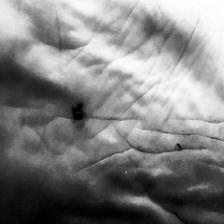

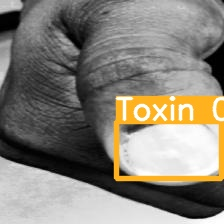

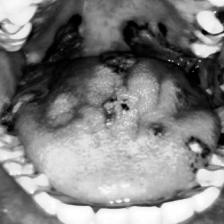

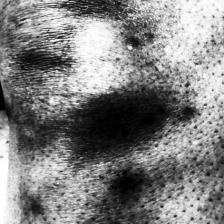

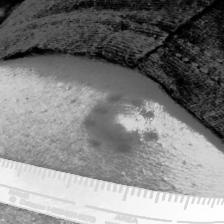

...

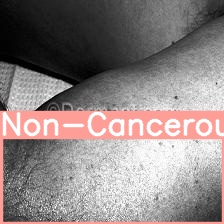

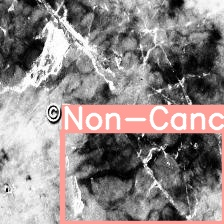

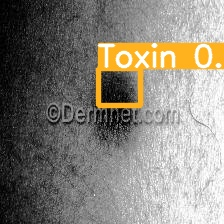

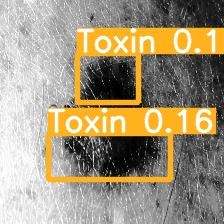

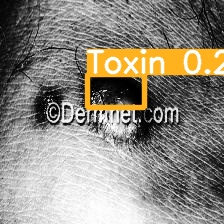

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/home/studio-lab-user/teledermatologyAI_capstone/objDetection/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

# Conclusion and Next Steps

Congratulations! You've trained a custom YOLOv5 model to recognize your custom objects.

To improve you model's performance, we recommend first interating on your datasets coverage and quality. See this guide for [model performance improvement](https://github.com/ultralytics/yolov5/wiki/Tips-for-Best-Training-Results).

To deploy your model to an application, see this guide on [exporting your model to deployment destinations](https://github.com/ultralytics/yolov5/issues/251).

Once your model is in production, you will want to continually iterate and improve on your dataset and model via [active learning](https://blog.roboflow.com/what-is-active-learning/).

In [20]:
#export your model's weights for future use
# from google.colab import files
# files.download('./runs/train/exp/weights/best.pt')

In [23]:
!python export.py --weights ./runs/train/exp/weights/best.pt --include torchscript --img 416

export: data=data/coco128.yaml, weights=['./runs/train/exp/weights/best.pt'], imgsz=[416], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript']
YOLOv5 🚀 v6.2-205-geef9057 Python-3.10.4 torch-1.11.0+cu102 CPU

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 10647, 10) (13.7 MB)

TorchScript: starting export with torch 1.11.0+cu102...
TorchScript: export success ✅ 1.2s, saved as runs/train/exp/weights/best.torchscript (27.1 MB)

Export complete (1.7s)
Results saved to /home/studio-lab-user/teledermatologyAI_capstone/objDetection/yolov5/runs/train/exp/weights
Detect:          python detect.py --weights runs/train/exp/weights/best.torchscript 
V